# Analysis of the collaborative network Github :
## Analysis of collaboration in the electron project
The Electron Framework allows you to write cross-platform desktop applications using JavaScript, HTML and CSS. It is based on Node.js and Chromium and is used by the Atom editor and many other applications.
The git repository of the project](https://github.com/electron/electron) has about 1035 contributors and used by more than 100k users

The goals of this project are: 
  - Extract the contribution history of this project
  - Cleaning and filtering of this data
  - generation of the adjacency matrix of the collaboration network graph




## Extracting data 


In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from datetime import datetime
import git



In [2]:
pd.set_option('display.max_columns', 20)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)

### Clone repository to machine and insert path bellow

In [3]:
path = "C:\\Users\\msahl\\Desktop\\PFA\\electron"

In [4]:
g=git.Git(path)

In [5]:
initial_logs=g.log('--pretty="%x40%h%x2C%an%x2C%ad%x2C"','--name-only','--date=short','--no-merges')



In [6]:
def parse_logs(logs):
    logs=logs.split('@')
    parsed=[]
    for line in logs:
        j=line.split(',')
        parsed.append(list(j))
    parsed=parsed[1:]
    for i in range(len(parsed)):
        parsed[i][3]=parsed[i][3].translate(str.maketrans("\n", " ")) 
        parsed[i][3]=parsed[i][3].translate(str.maketrans("\"", " ")) 
    return parsed

In [7]:
commit_history=parse_logs(initial_logs)

In [8]:
# names that contain ,
for i in range(len(commit_history)):
    if(len(commit_history[i])== 5):
        commit_history[i][1]= commit_history[i][1]+commit_history[i][2]
        commit_history[i].remove(commit_history[i][2])
  


In [9]:
data = pd.DataFrame(commit_history, columns =["sha","author","timestamp","files"])

In [10]:
data.to_csv("logs.csv", index=False)

## Exploring the data

In [11]:
data.head()

,sha,author,timestamp,files
0,fa2db00e5,electron-roller[bot],2021-06-04,DEPS patches/chromium/.patches patches/chromium/add_didinstallconditionalfeatures.patch patches/chromium/allow_disabling_blink_scheduler_throttling_per_renderview.patch patches/chromium/blink_local_frame.patch patches/chromium/build_do_not_depend_on_packed_resource_integrity.patch patches/chromium/build_do_not_include_vr_directx_helpers_when_enable_vr.patch patches/chromium/can_create_window.patch patches/chromium/chore_provide_iswebcontentscreationoverridden_with_full_params.patch patches/chromium/chore_use_electron_resources_not_chrome_for_spellchecker.patch patches/chromium/disable-redraw-lock.patch patches/chromium/don_t_use_potentially_null_getwebframe_-_view_when_get_blink.patch patches/chromium/enable_reset_aspect_ratio.patch patches/chromium/expose_setuseragent_on_networkcontext.patch patches/chromium/fix_expose_decrementcapturercount_in_web_contents_impl.patch patches/chromium/fix_use_electron_generated_resources.patch patches/chromium/frame_host_manager.patch patches/chromium/gritsettings_resource_ids.patch patches/chromium/mas_no_private_api.patch patches/chromium/network_service_allow_remote_certificate_verification_logic.patch patches/chromium/no_cache_storage_check.patch patches/chromium/picture-in-picture.patch patches/chromium/refactor_expose_cursor_changes_to_the_webcontentsobserver.patch patches/chromium/render_widget_host_view_mac.patch patches/chromium/resource_file_conflict.patch patches/chromium/revert_remove_contentrendererclient_shouldfork.patch patches/chromium/scroll_bounce_flag.patch patches/chromium/web_contents.patch patches/chromium/worker_context_will_destroy.patch patches/chromium/worker_feat_add_hook_to_notify_script_ready.patch patches/v8/dcheck.patch shell/browser/api/electron_api_web_contents.cc shell/browser/api/electron_api_web_contents.h shell/browser/browser_process_impl.cc shell/browser/browser_process_impl.h shell/browser/ui/inspectable_web_contents.cc shell/browser/ui/inspectable_web_contents.h
1,1c0e8a65c,Electron Bot,2021-06-04,ELECTRON_VERSION package.json shell/browser/resources/win/electron.rc
2,79ae8b427,David Sanders,2021-06-03,shell/browser/api/electron_api_cookies.cc
3,8e1176cbc,David Sanders,2021-06-03,shell/browser/net/proxying_url_loader_factory.cc shell/browser/net/proxying_url_loader_factory.h
4,81c5da522,David Sanders,2021-06-03,shell/app/electron_crash_reporter_client.cc shell/browser/api/electron_api_in_app_purchase.cc shell/browser/api/event.cc shell/browser/api/views/electron_api_image_view.cc shell/browser/badging/badge_manager_factory.cc shell/browser/child_web_contents_tracker.cc shell/browser/electron_javascript_dialog_manager.cc shell/browser/electron_pdf_web_contents_helper_client.cc shell/browser/extensions/api/management/electron_management_api_delegate.cc shell/browser/extensions/api/resources_private/resources_private_api.cc shell/browser/extensions/api/tabs/tabs_api.cc shell/browser/extensions/electron_component_extension_resource_manager.cc shell/browser/extensions/electron_extension_host_delegate.cc shell/browser/extensions/electron_extension_system_factory.cc shell/browser/extensions/electron_extension_web_contents_observer.cc shell/browser/extensions/electron_extensions_api_client.cc shell/browser/extensions/electron_extensions_browser_client.cc shell/browser/extensions/electron_kiosk_delegate.cc shell/browser/extensions/electron_navigation_ui_data.cc shell/browser/native_browser_view_mac.mm shell/browser/native_window_mac.mm shell/browser/net/asar/asar_url_loader.cc shell/browser/notifications/win/notification_presenter_win.cc shell/browser/notifications/win/windows_toast_notification.cc shell/browser/printing/print_view_manager_electron.cc shell/browser/protocol_registry.cc shell/browser/serial/serial_chooser_context_factory.cc shell/browser/ui/cocoa/delayed_native_view_host.cc shell/browser/ui/cocoa/electron_native_widget_mac.mm shell/browser/ui/cocoa/root_view_mac.mm shell/bro

In [12]:
data.tail()

,sha,author,timestamp,files
21160,fe35a92de,Adam Roben,2013-03-14,brightray/brightray.gyp brightray/common/application_name_mac.mm brightray/common/mac/main_application_bundle.h brightray/common/mac/main_application_bundle.mm brightray/common/main_delegate_mac.mm
21161,b2a79856e,Adam Roben,2013-03-14,brightray/brightray.gyp brightray/browser/browser_main_parts.cc brightray/browser/browser_main_parts.h brightray/browser/devtools_delegate.cc brightray/browser/devtools_delegate.h brightray/browser/devtools_frontend.cc brightray/browser/devtools_frontend.h brightray/browser/inspectable_web_contents.cc brightray/browser/inspectable_web_contents.h brightray/browser/inspectable_web_contents_impl.cc brightray/browser/inspectable_web_contents_impl.h brightray/browser/inspectable_web_contents_view.h brightray/browser/inspectable_web_contents_view_mac.h brightray/browser/inspectable_web_contents_view_mac.mm brightray/browser/mac/bry_inspectable_web_contents_view.h brightray/browser/mac/bry_inspectable_web_contents_view.mm brightray/browser/mac/bry_inspectable_web_contents_view_private.h brightray/common/content_client.cc brightray/common/content_client.h brightray/common/main_delegate.cc brightray/common/main_delegate.h brightray/common/main_delegate_mac.mm
21162,e1b5e5e1b,Adam Roben,2013-03-13,brightray/brightray.gyp brightray/browser/browser_context.cc brightray/common/application_name.h brightray/common/application_name_mac.mm brightray/common/main_delegate_mac.mm
21163,65dd011fa,Adam Roben,2013-03-13,brightray/browser/browser_client.h brightray/browser/browser_context.h brightray/browser/browser_main_parts.h brightray/browser/network_delegate.h brightray/browser/url_request_context_getter.h brightray/common/main_delegate.h
21164,e451d9212,Adam Roben,2013-03-13,brightray/.gitignore brightray/.gitmodules brightray/LICENSE brightray/LICENSE-CHROMIUM brightray/README.md brightray/brightray.gyp brightray/brightray.gypi brightray/browser/browser_client.cc brightray/browser/browser_client.h brightray/browser/browser_context.cc brightray/browser/browser_context.h brightray/browser/browser_main_parts.cc brightray/browser/browser_main_parts.h brightray/browser/browser_main_parts_mac.mm brightray/browser/mac/bry_application.h brightray/browser/mac/bry_application.mm brightray/browser/network_delegate.cc brightray/browser/network_delegate.h brightray/browser/url_request_context_getter.cc brightray/browser/url_request_context_getter.h brightray/common/main_delegate.cc brightray/common/main_delegate.h brightray/common/main_delegate_mac.mm brightray/script/bootstrap brightray/script/build brightray/tools/mac/change_mach_o_flags.py brightray/tools/mac/make_more_helpers.sh brightray/vendor/.gitignore brightray/vendor/libchromiumcontent


In [13]:
## Vérification des types de données 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21165 entries, 0 to 21164
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   sha        21165 non-null  object
 1   author     21165 non-null  object
 2   timestamp  21165 non-null  object
 3   files      21165 non-null  object
dtypes: object(4)
memory usage: 661.5+ KB


In [14]:
## Vérification des données manquant
data.isna().sum()

sha          0
author       0
timestamp    0
files        0
dtype: int64

In [15]:
data['timestamp'] =  pd.to_datetime(data['timestamp'])
data['commit_year'] = data['timestamp'].dt.year

## Primary data analysis

In [16]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False)

In [17]:
commits_by_author = data.groupby('author')[['sha']].count()
commits_by_author = commits_by_author.rename(columns = {'sha': 'commit_count'})
commits_by_author = commits_by_author.sort_values(by='commit_count', ascending=False)
top_authors = commits_by_author.head(30)

In [18]:
top_authors

,commit_count
author,
Cheng Zhao,6236
Kevin Sawicki,2138
Samuel Attard,1121
Shelley Vohr,982
Electron Bot,906
Jeremy Apthorp,745
deepak1556,648
Milan Burda,478
Zeke Sikelianos,414


In [19]:
fig = go.Figure([go.Bar(
    x=top_authors.index, 
    y=top_authors.commit_count)])
fig.update_layout(
    title = 'Top Committers', 
    xaxis_title = 'Author', 
    yaxis_title = 'Commits Count', 
    xaxis_tickmode = 'linear',
    xaxis_tickangle=-40)
fig.show()

In [20]:
commits_by_day = data.groupby('timestamp')[['sha']].count()
commits_by_day =commits_by_day.rename(columns = {'sha': 'commit_count'})


In [21]:
fig = go.Figure([go.Scatter(
    x=commits_by_day.index, 
    y=commits_by_day.commit_count, 
    text=commits_by_day.commit_count, 
    fill='tozeroy')])
fig.update_layout(
    title = 'Commits by Date', 
    xaxis_title = 'Date', 
    yaxis_title = 'Commits Count')
fig.show()

In [22]:
yearly_commits = data.groupby('commit_year')[['sha']].count()
yearly_commits = yearly_commits.rename(columns = {'sha': 'commits_count'})
yearly_commits['daily_avg'] = yearly_commits['commits_count']/365

In [23]:
fig = go.Figure([go.Scatter(
    x=yearly_commits.index, 
    y=yearly_commits.daily_avg, 
    text=yearly_commits.daily_avg
)])
fig.update_layout(
    title = 'Average Daily Commits by Year', 
    xaxis_title = 'Year', 
    yaxis_title = 'Average Number of Commits',
    xaxis_tickmode = 'linear')
fig.show()

## Creating adjancency MATRIX

In [24]:
data=data[data['commit_year']==2016]

In [25]:
data

,sha,author,timestamp,files,commit_year
8730,b4a8ed01f,Hari Krishna Reddy Juturu,2016-11-16,atom/browser/api/atom_api_web_contents.cc docs/api/web-contents.md docs/api/webview-tag.md lib/browser/guest-view-manager.js lib/renderer/init.js spec/webview-spec.js,2016
8736,8dde27af4,Zeke Sikelianos,2016-11-23,npm/electron.d.ts,2016
8737,3f74a2ab4,Zeke Sikelianos,2016-11-07,npm/electron.d.ts npm/package.json,2016
9514,ba3fbc9d1,Samuel Attard,2016-12-16,atom/browser/native_window_mac.mm,2016
9515,28d5c8bbd,Samuel Attard,2016-12-16,atom/browser/native_window_mac.mm default_app/default_app.js,2016
...,...,...,...,...,...
14563,9e2b76361,leethomas,2016-01-01,docs/api/web-contents.md docs/api/web-view-tag.md,2016
14564,911e60b50,leethomas,2016-01-01,atom/browser/api/atom_api_web_contents.cc atom/browser/lib/guest-view-manager.coffee atom/renderer/lib/web-view/guest-view-internal.coffee,2016
14565,9f6319dd7,leethomas,2016-01-01,atom/browser/lib/guest-view-manager.coffee atom/renderer/lib/web-view/guest-view-internal.coffee,2016
14566,54c8c3e3f,leethomas,2016-01-01,atom/browser/api/atom_api_web_contents.cc docs/api/web-view-tag.md,2016


#### Since we want to see the interconnection between collaborators we need to create a dataframe such as ['author name': "File1", "File2","..."]

In [26]:
filtre1 = ['author', 'files'] 
data_2 = data[filtre1]
data_2

,author,files
8730,Hari Krishna Reddy Juturu,atom/browser/api/atom_api_web_contents.cc docs/api/web-contents.md docs/api/webview-tag.md lib/browser/guest-view-manager.js lib/renderer/init.js spec/webview-spec.js
8736,Zeke Sikelianos,npm/electron.d.ts
8737,Zeke Sikelianos,npm/electron.d.ts npm/package.json
9514,Samuel Attard,atom/browser/native_window_mac.mm
9515,Samuel Attard,atom/browser/native_window_mac.mm default_app/default_app.js
...,...,...
14563,leethomas,docs/api/web-contents.md docs/api/web-view-tag.md
14564,leethomas,atom/browser/api/atom_api_web_contents.cc atom/browser/lib/guest-view-manager.coffee atom/renderer/lib/web-view/guest-view-internal.coffee
14565,leethomas,atom/browser/lib/guest-view-manager.coffee atom/renderer/lib/web-view/guest-view-internal.coffee
14566,leethomas,atom/browser/api/atom_api_web_contents.cc docs/api/web-view-tag.md


In [27]:

list_1 = data_2.values.T.tolist()
##  [[author1],[author2]....]
casted_to_str=[]
authors=[]
for i in list_1[0]:#conversion en str 
    casted_to_str.append(str(i))
for i in casted_to_str :
    if (i != 'nan'):
        authors.append(i)
authors_filtered=[]
for a in authors:
    temp = []
    temp.append(a)
    authors_filtered.append(temp)


In [28]:
##  [[file1,file2...],[file1,file2...]....]

files = []
casted_to_str = []
for i in list_1[1]:
    casted_to_str.append(str(i))

for i in casted_to_str:
    if (i != ''):
        files.append(i)

for i in range(len(files)):
    files[i]=files[i].split(" ")   

files_filtered=[]

for i in range(len(files)):
    temp=[]
    for j in files[i]:
          if (j != ''):
                temp.append(j)
    files_filtered.append(temp)
    


In [29]:
len(files_filtered)==len(authors_filtered) 
  

True

In [30]:

Res = []

for i in range(len(authors_filtered)):  # or listed_files because they have the same length

    tempo = []

    tempo = authors_filtered[i] + files_filtered[i]

    Res.append(tempo)


In [31]:

regrouped_data = defaultdict(list)
for k, *v in Res:
    regrouped_data[k].append(v)



regrouped_data= list(regrouped_data.items())

regrouped_data_temp=[]

for i in regrouped_data:
    regrouped_data_temp.append(list(i))


for i in regrouped_data_temp:

    for j in range(1, len( i[1])):

        i[1][0] = i[1][0] + i[1][1]

        del i[1][1]



for i in regrouped_data_temp:

    for j in range(len(i[1][0])):

        i.append(i[1][0][j])

    del i[1]




regrouped_data_filtered=[]

for i in regrouped_data_temp:

    i= list(dict.fromkeys(i))

    regrouped_data_filtered.append(i)
df=pd.DataFrame(regrouped_data_filtered)
df.head()


,0,1,2,3,4,5,6,7,8,9,...,661,662,663,664,665,666,667,668,669,670
0,Hari Krishna Reddy Juturu,atom/browser/api/atom_api_web_contents.cc,docs/api/web-contents.md,docs/api/webview-tag.md,lib/browser/guest-view-manager.js,lib/renderer/init.js,spec/webview-spec.js,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,Zeke Sikelianos,npm/electron.d.ts,npm/package.json,spec/webview-spec.js,spec/fixtures/pages/webview-log-process.html,lib/renderer/init.js,lib/renderer/web-view/web-view-attributes.js,lib/renderer/web-view/web-view.js,filenames.gypi,lib/renderer/web-view/guest-view-internal.js,...,None,None,None,None,None,None,None,None,None,None
2,Samuel Attard,atom/browser/native_window_mac.mm,default_app/default_app.js,atom/browser/api/atom_api_window.cc,atom/browser/api/atom_api_window.h,atom/browser/native_window.cc,atom/browser/native_window.h,atom/browser/native_window_mac.h,default_app/icon.png,lib/browser/api/browser-window.js,...,None,None,None,None,None,None,None,None,None,None
3,Greg Nolle,atom/browser/api/atom_api_session.cc,atom/browser/net/atom_cert_verifier.cc,atom/browser/net/atom_cert_verifier.h,docs/api/session.md,lib/browser/api/session.js,lib/browser/rpc-server.js,lib/renderer/api/remote.js,spec/api-session-spec.js,spec/api-app-spec.js,...,None,None,None,None,None,None,None,None,None,None
4,Yury Solovyov,spec/api-app-spec.js,docs/api/app.md,atom/browser/api/atom_api_app.cc,atom/browser/api/atom_api_app.h,atom/common/fileicon_fetcher.h,chromium_src/chrome/browser/browser_process.cc,chromium_src/chrome/browser/browser_process.h,atom/common/fileicon_fetcher.cc,atom/common/api/atom_api_native_image.cc,...,None,None,None,None,None,None,None,None,None,None


In [32]:
authors = []
for e in regrouped_data_filtered:
    authors.append(e[0])
    

In [33]:
matrice = np.zeros((len(regrouped_data_filtered), len(regrouped_data_filtered))) 



def intersection(lst1,lst2):  

    R = list(set(lst1) & set(lst2))

    I = len(R)

    return I


for i in range(len(regrouped_data_filtered)):  

    for j in range(len(regrouped_data_filtered)):

        H = intersection(regrouped_data_filtered[i], regrouped_data_filtered[j])

        if (i != j):  

            matrice[i][j] = H


matrice = pd.DataFrame(data=matrice, columns=authors,index=authors)  
matrice.to_csv('MATRICE_ADJACENTE.mat', index=True,header=True)  

In [34]:
matrice

,Hari Krishna Reddy Juturu,Zeke Sikelianos,Samuel Attard,Greg Nolle,Yury Solovyov,Yury,deepak1556,Robo,Ramya Achutha Rao,Kevin Sawicki,...,Ming Luo,大和屋 貴仁,Joe Naha,Wei Wang,Krzysztof,Christopher Dieringer,ZhangYueqiu,Omri Litov,foxy,Levin Rickert
Hari Krishna Reddy Juturu,0.0,5.0,3.0,0.0,0.0,0.0,3.0,4.0,0.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Zeke Sikelianos,5.0,0.0,56.0,7.0,3.0,0.0,37.0,22.0,2.0,182.0,...,2.0,10.0,6.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0
Samuel Attard,3.0,56.0,0.0,3.0,2.0,0.0,21.0,17.0,2.0,92.0,...,2.0,0.0,0.0,1.0,0.0,1.0,0.0,7.0,0.0,0.0
Greg Nolle,0.0,7.0,3.0,0.0,1.0,0.0,9.0,6.0,0.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Yury Solovyov,0.0,3.0,2.0,1.0,0.0,2.0,7.0,13.0,0.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Christopher Dieringer,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZhangYueqiu,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Omri Litov,0.0,1.0,7.0,0.0,0.0,0.0,1.0,1.0,0.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
foxy,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Social network analysis of repository

We can also read the .mat file with cytoscape to get better visualisation of data 
#to do usepy2cytoscape 

In [35]:
import networkx as nx
import matplotlib.pyplot as plt
import nxviz as nv


In [36]:
graph=nx.from_pandas_adjacency(matrice)


In [61]:
print(nx.info(graph))
nodes=graph.number_of_nodes()

Name: 
Type: Graph
Number of nodes: 340
Number of edges: 3865
Average degree:  22.7353


# Important Nodes 

## Degree Centrality


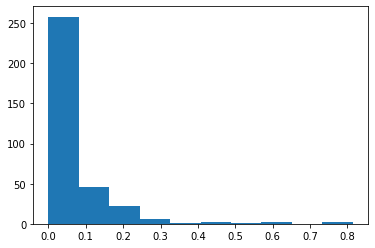

In [38]:
# Plot the degree distribution of the GitHub collaboration network
plt.hist(list(nx.degree_centrality(graph).values()))
plt.show()

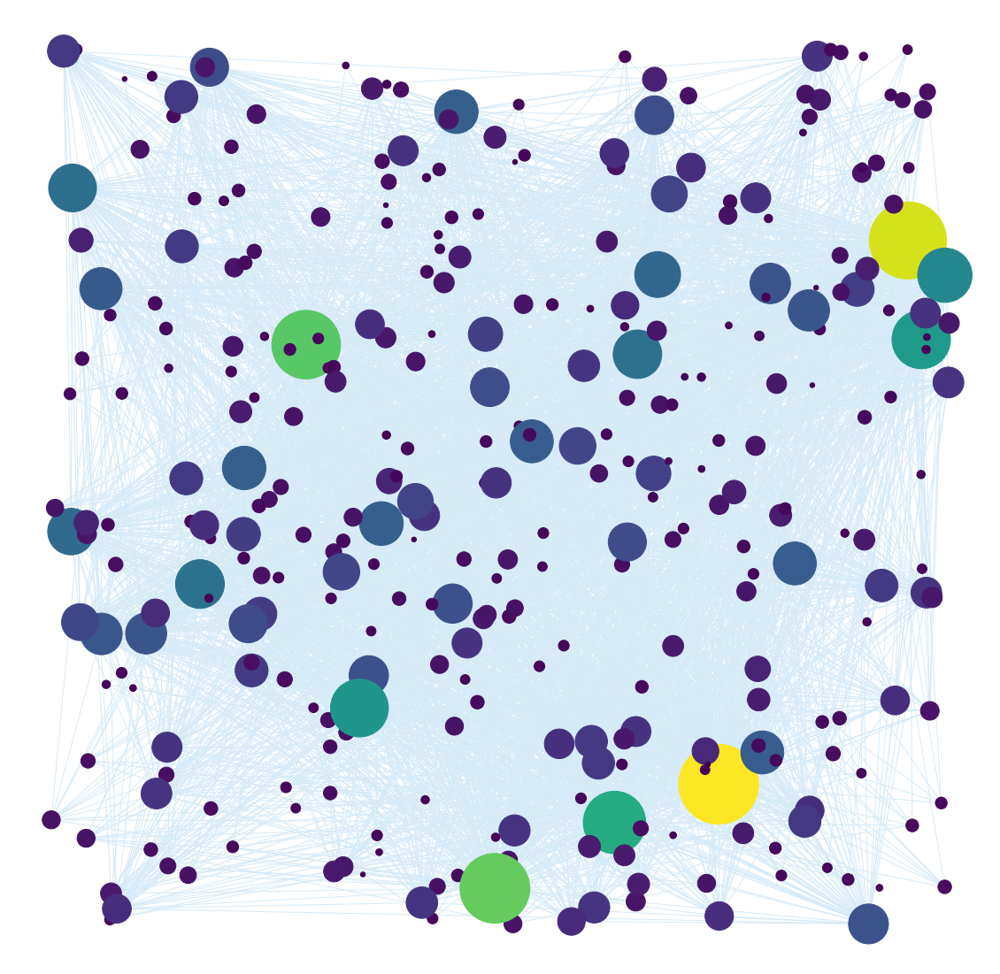

In [39]:
pos = nx.random_layout(graph)
degCent = nx.degree_centrality(graph)
node_color = [20000.0 * graph.degree(v) for v in graph]
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(graph, pos=pos, with_labels=False,
                 node_color=node_color,
                 node_size=node_size,edge_color='#D6EAF8')
plt.axis('off')
f=sorted(degCent, key=degCent.get, reverse=True)[:5]

### Subgraph of contributers with highest degree centrality

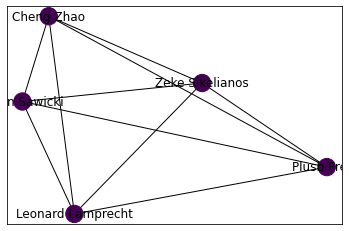

In [40]:
subgraph1 = graph.subgraph(sorted(degCent, key=degCent.get, reverse=True)[:5])
node_color = [20000.0 * subgraph1.degree(v) for v in subgraph1]
nx.draw_networkx(subgraph1, with_labels=True,
                 node_color=node_color,
               )

In [62]:
avg_degree= sum(degCent.values())/nodes
print(avg_degree)

0.06706576435884087


## Betweness Centrality

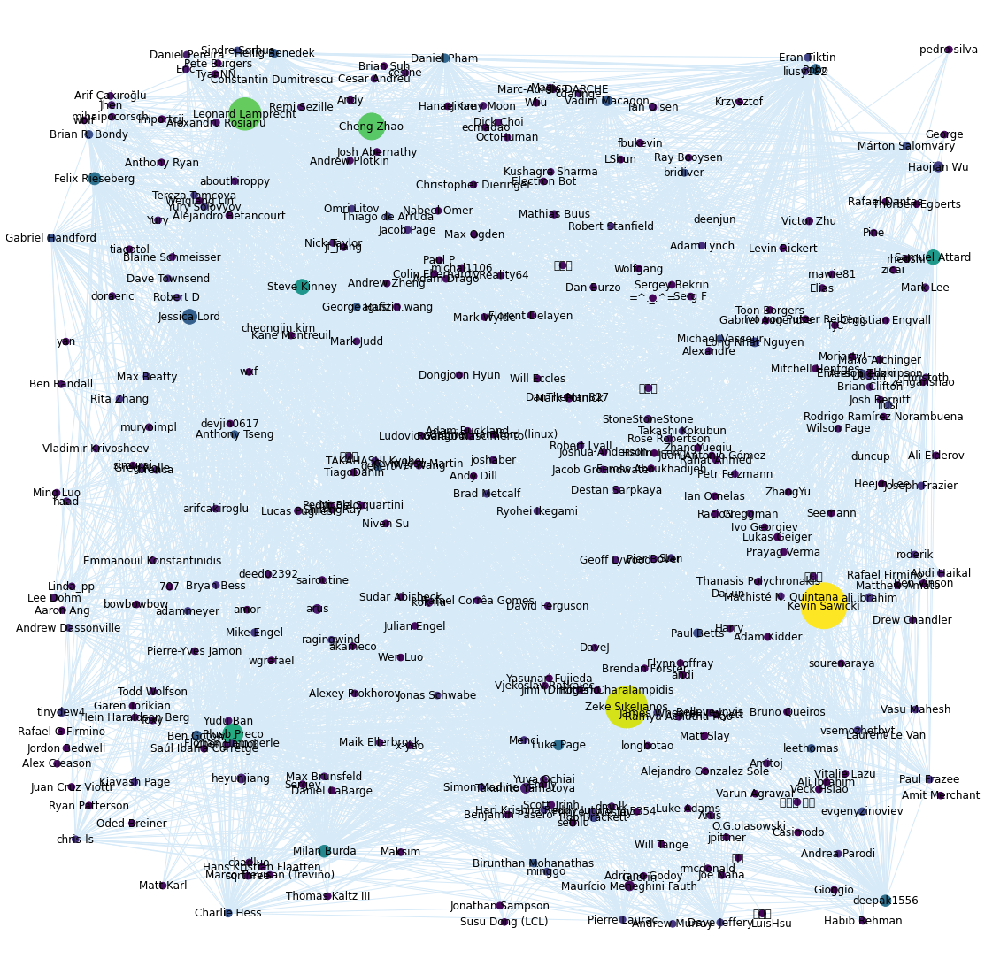

In [60]:
pos = nx.random_layout(graph)
betCent = nx.betweenness_centrality(graph, normalized=True, endpoints=True)
node_color = [20000.0 * graph.degree(v) for v in graph]
node_size =  [v * 10000 for v in betCent.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(graph, pos=pos, with_labels=True,
                 node_color=node_color,
                 node_size=node_size,edge_color='#D6EAF8' )
plt.axis('off')
f=sorted(betCent, key=betCent.get, reverse=True)[:5]

### Subgraph of contributers with highest betweeness centrality

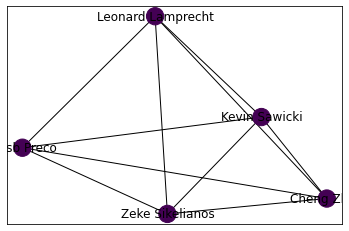

In [43]:
subgraph2 = graph.subgraph(sorted(betCent, key=betCent.get, reverse=True)[:5])
node_color = [125.0 * subgraph2.degree(v) for v in subgraph2]
nx.draw_networkx(subgraph2, with_labels=True,
                 node_color=node_color
               )

In [63]:
avg_betweeness= sum(betCent.values())/nodes
print(avg_betweeness)

0.008349460554653897


## Closeness Centrality


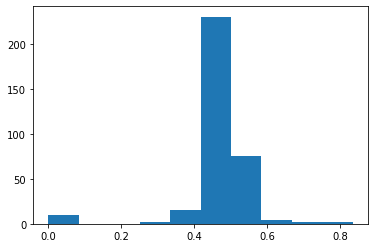

In [46]:
plt.hist(list(nx.closeness_centrality(graph).values()))
plt.show()

['Kevin Sawicki',
 'Zeke Sikelianos',
 'Leonard Lamprecht',
 'Cheng Zhao',
 'Plusb Preco']

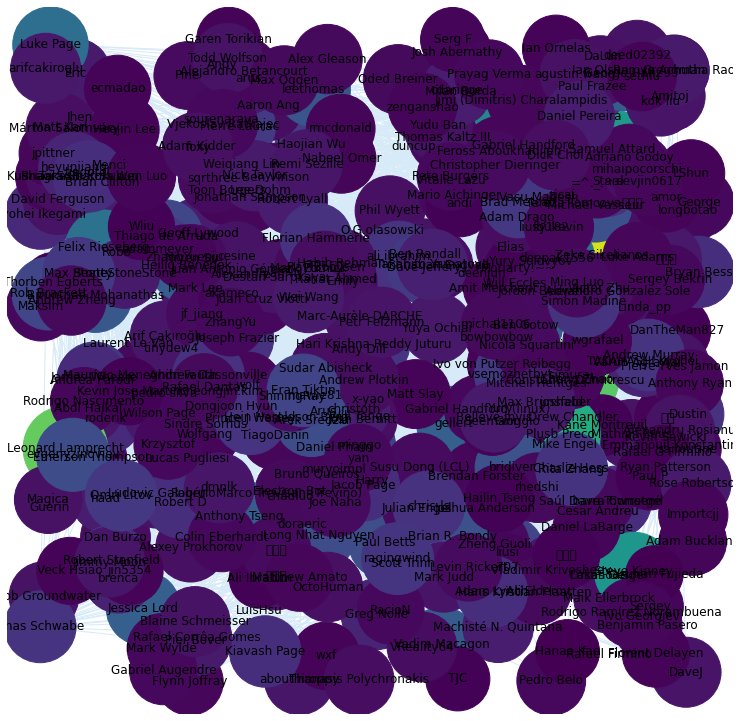

In [47]:
pos = nx.random_layout(graph)
cloCent = nx.closeness_centrality(graph)
node_color = [20000.0 * graph.degree(v) for v in graph]
node_size =  [v * 10000 for v in cloCent.values()]
plt.figure(figsize=(13,13))
nx.draw_networkx(graph, pos=pos, with_labels=True,
                 node_color=node_color,
                 node_size=node_size,edge_color='#D6EAF8' )
plt.axis('off')
sorted(cloCent, key=cloCent.get, reverse=True)[:5]

In [64]:
avg_closeness = sum(cloCent.values())/nodes
print(avg_closeness)

0.4724215363621358


### Subgraph of contributers with highest closeness centrality

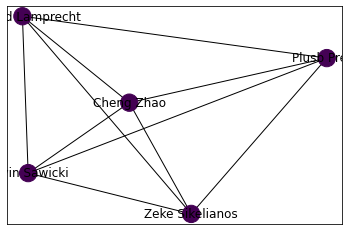

In [50]:
subgraph2 = graph.subgraph(sorted(cloCent, key=cloCent.get, reverse=True)[:5])
node_color = [125.0 * subgraph2.degree(v) for v in subgraph2]
nx.draw_networkx(subgraph2, with_labels=True,
                 node_color=node_color
               )

## Eeigenvector Centrality


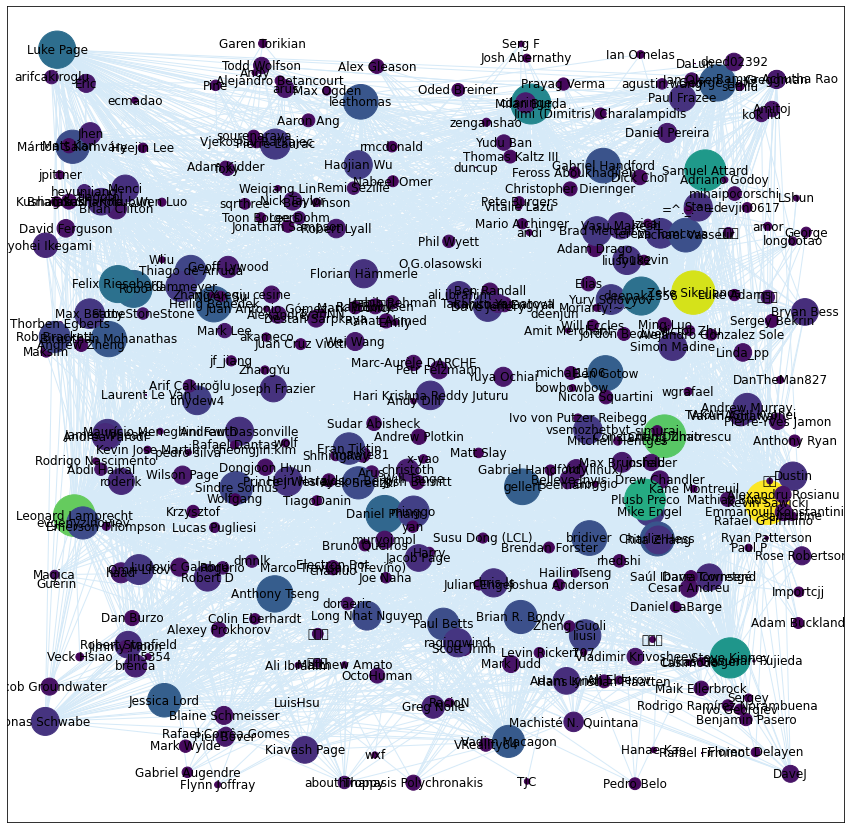

In [51]:
eigCent = nx.eigenvector_centrality(graph)
node_color = [20000.0 * graph.degree(v) for v in graph]
node_size =  [v * 10000 for v in eigCent.values()]
plt.figure(figsize=(15,15))
nx.draw_networkx(graph, pos=pos, with_labels=True,
                 node_color=node_color,
                 node_size=node_size,edge_color='#D6EAF8' )

In [65]:
avg_eighvector= sum(eigCent.values())/nodes
print(avg_eighvector)

0.03547786145170858


### Subgraph of contributers with highest eightvector centrality

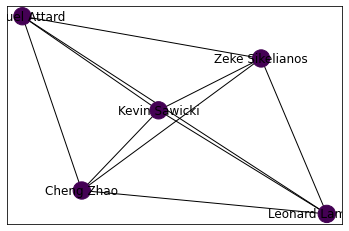

In [53]:
subgraph2 = graph.subgraph(sorted(eigCent, key=eigCent.get, reverse=True)[:5])
node_color = [125.0 * subgraph2.degree(v) for v in subgraph2]
nx.draw_networkx(subgraph2, with_labels=True,
                 node_color=node_color
               )

# Top ten collaborators based on their degree, in-degree, betweenness, Eigenvector centrality and clustering coefficient.

In [54]:
#TO DO

## Connected Components


Subgraph has 330 nodes


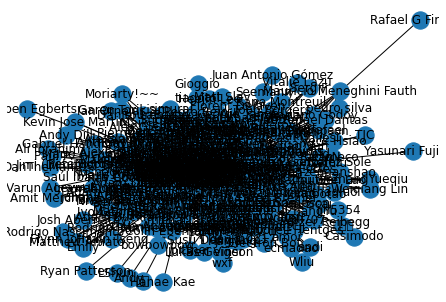

Subgraph has 1 nodes


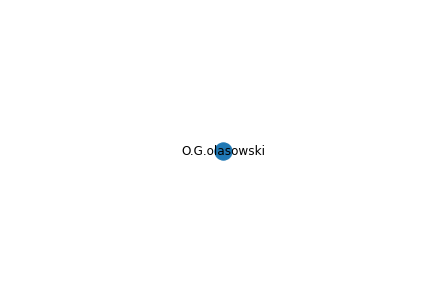

Subgraph has 1 nodes


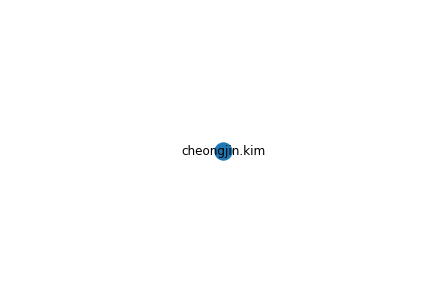

Subgraph has 2 nodes


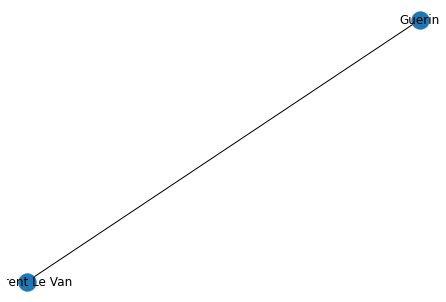

Subgraph has 1 nodes


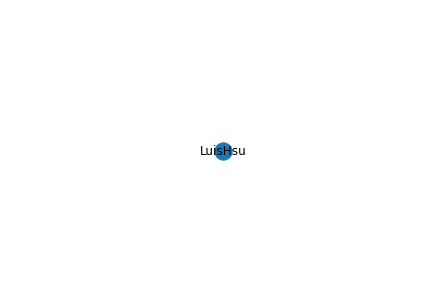

Subgraph has 1 nodes


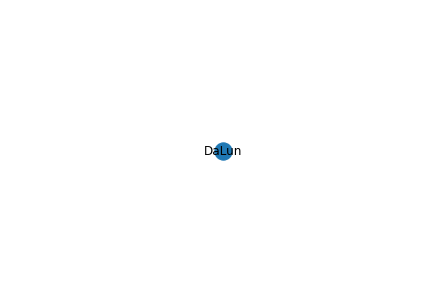

Subgraph has 1 nodes


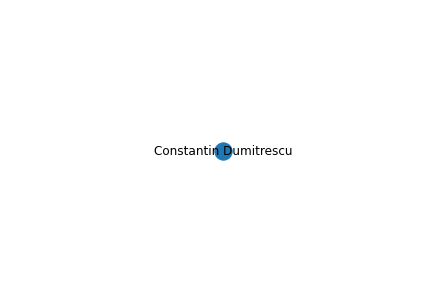

Subgraph has 1 nodes


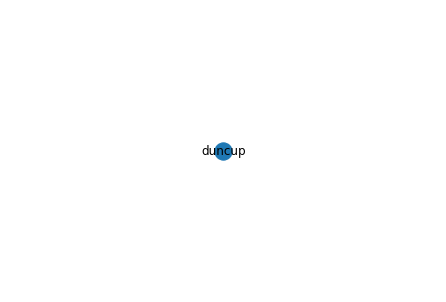

Subgraph has 1 nodes


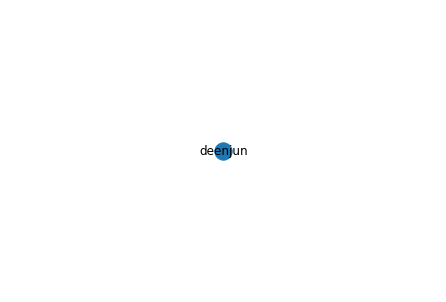

Subgraph has 1 nodes


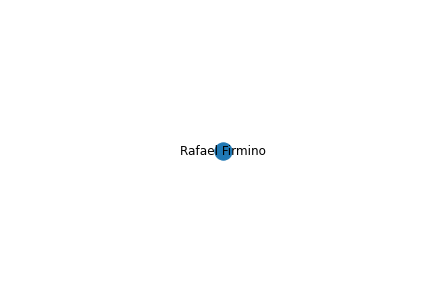

In [55]:
graph_un = graph.to_undirected()
subgraphs = [graph_un.subgraph(c) for c in nx.connected_components(graph_un)]
for sg in subgraphs:
    print(f'Subgraph has {len(sg.nodes())} nodes')
    nx.draw(sg, with_labels=True)
    plt.show()

### Largest connected component

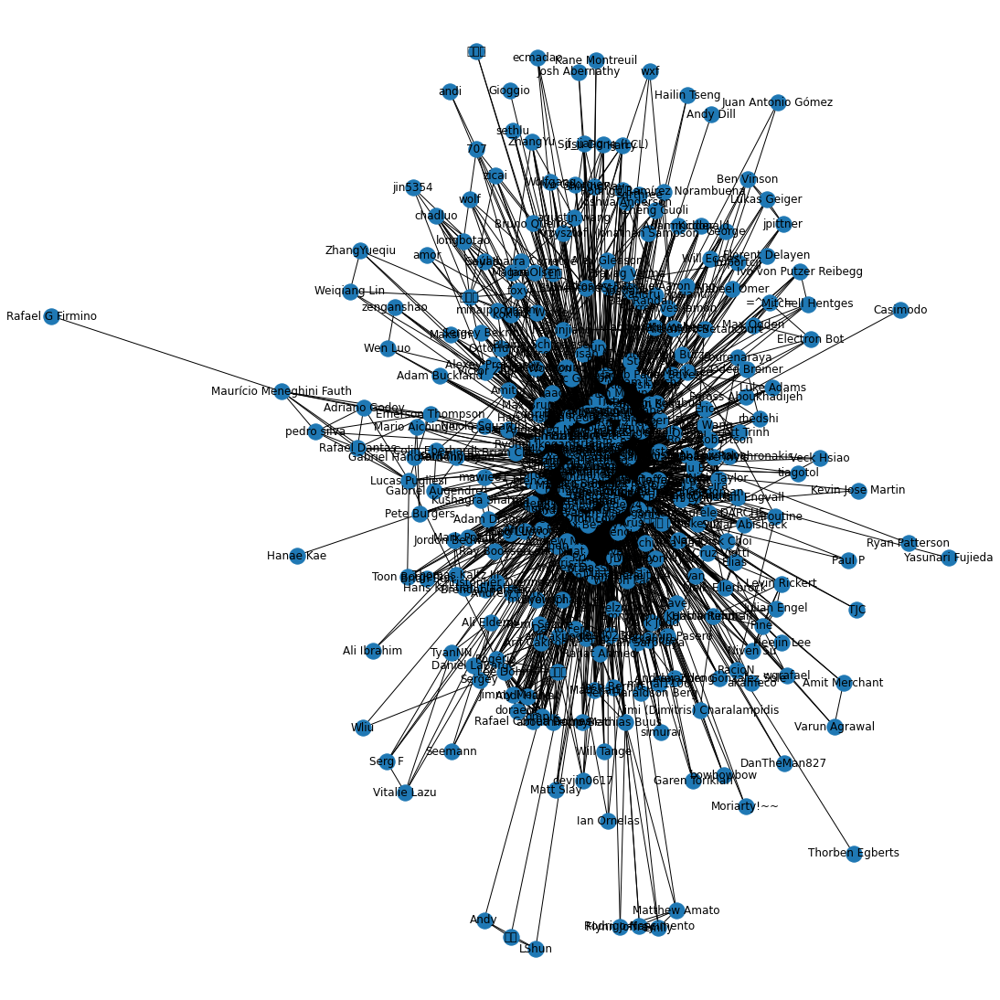

In [56]:
largest_ccs = sorted(subgraphs, key=lambda x: len(x))[-1]
plt.figure(figsize=(15, 15))
nx.draw(largest_ccs, with_labels=True)
plt.show()

## Ciques

In [57]:
cliques = sorted([len(cl) for cl in nx.find_cliques(graph_un)], reverse=True)
print(cliques)
print(f'There are {len(cliques)} cliques.')

[40, 37, 34, 32, 31, 31, 30, 30, 30, 29, 29, 29, 29, 29, 29, 29, 28, 28, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18,

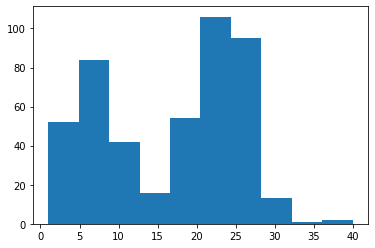

In [58]:
plt.hist(cliques)
plt.show()

The largest maximal clique consists of 40 users


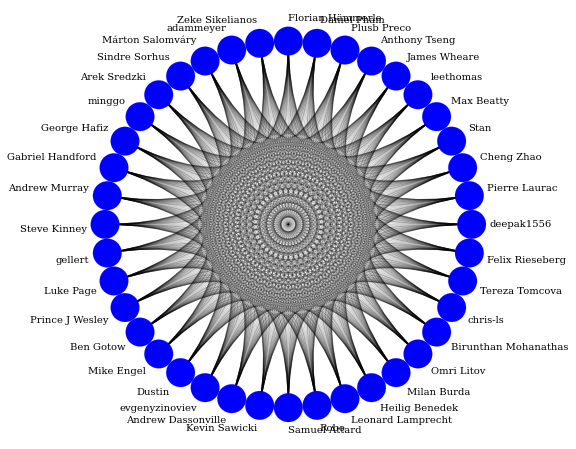

In [59]:
# Find the author(s) that are part of the largest maximal clique: largest_clique
largest_clique = sorted(nx.find_cliques(graph_un), key=lambda x:len(x))[-1]

# Create the subgraph of the largest_clique: G_lc
G_lc = graph_un.subgraph(largest_clique)

# Create the CircosPlot object: c
c = nv.CircosPlot(G_lc, node_labels=True, figsize=(8, 8))

# Draw the CircosPlot to the screen
print(f'The largest maximal clique consists of {len(largest_clique)} users')
c.draw()
plt.show()